<a href="https://colab.research.google.com/github/sakshigithubit/Object_detection/blob/main/object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v2_coco_2018_03_29.tar.gz
!tar -zxf ssd_mobilenet_v2_coco_2018_03_29.tar.gz

--2024-11-05 17:05:57--  http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v2_coco_2018_03_29.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.101.207, 142.251.2.207, 142.250.141.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.101.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 187925923 (179M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_coco_2018_03_29.tar.gz’

ssd_mobilenet_v2_co 100%[===================>] 179.22M   166MB/s    in 1.1s    

2024-11-05 17:05:59 (166 MB/s) - ‘ssd_mobilenet_v2_coco_2018_03_29.tar.gz’ saved [187925923/187925923]



In [2]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4305, done.
remote: Counting objects: 100% (4305/4305), done.
remote: Compressing objects: 100% (3291/3291), done.
remote: Total 4305 (delta 1210), reused 2185 (delta 941), pack-reused 0 (from 0)
Receiving objects: 100% (4305/4305), 53.16 MiB | 18.28 MiB/s, done.
Resolving deltas: 100% (1210/1210), done.


In [3]:
cd models/research

/content/models/research


In [4]:
!protoc object_detection/protos/*.proto --python_out=.
!pip install object_detection

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.7 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 5.5.6
    Uninstalling ipyk

In [5]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [6]:
!pip install tf_slim

In [7]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [8]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name,
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [9]:
PATH_TO_LABELS = 'object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [10]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('object_detection/test_images/image1.jpg'),
 PosixPath('object_detection/test_images/image2.jpg'),
 PosixPath('object_detection/test_images/image3.jpg')]

In [11]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

76534733/76534733 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [14]:
print(detection_model.inputs)
detection_model.output_dtypes

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


{'detection_scores': tf.float32,
 'detection_boxes': tf.float32,
 'num_detections': tf.float32,
 'detection_classes': tf.float32}

In [15]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  input_tensor = tf.convert_to_tensor(image)
  input_tensor = input_tensor[tf.newaxis,...]
  output_dict = model(input_tensor)
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  if 'detection_masks' in output_dict:
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [16]:
def show_inference(model, image_path,class_id):
  image_np = np.array(Image.open(image_path))
  output_dict = run_inference_for_single_image(model, image_np)
  boxes = []
  classes = []
  scores = []
  for i,x in enumerate(output_dict['detection_classes']):
    if x==class_id and output_dict['detection_scores'][i] > 0.5:
      classes.append(x)
      boxes.append(output_dict['detection_boxes'][i])
      scores.append(output_dict['detection_scores'][i])
  boxes = np.array(boxes)
  classes = np.array(classes)
  scores = np.array(scores)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      boxes,
      classes,
      scores,
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=2)

  display(Image.fromarray(image_np))

In [17]:
def print_class_names():
  for index, class_name in category_index.items():
    print(f"Class ID: {index}, Class Name: {class_name['name']}")

print_class_names()

Class ID: 1, Class Name: person
Class ID: 2, Class Name: bicycle
Class ID: 3, Class Name: car
Class ID: 4, Class Name: motorcycle
Class ID: 5, Class Name: airplane
Class ID: 6, Class Name: bus
Class ID: 7, Class Name: train
Class ID: 8, Class Name: truck
Class ID: 9, Class Name: boat
Class ID: 10, Class Name: traffic light
Class ID: 11, Class Name: fire hydrant
Class ID: 13, Class Name: stop sign
Class ID: 14, Class Name: parking meter
Class ID: 15, Class Name: bench
Class ID: 16, Class Name: bird
Class ID: 17, Class Name: cat
Class ID: 18, Class Name: dog
Class ID: 19, Class Name: horse
Class ID: 20, Class Name: sheep
Class ID: 21, Class Name: cow
Class ID: 22, Class Name: elephant
Class ID: 23, Class Name: bear
Class ID: 24, Class Name: zebra
Class ID: 25, Class Name: giraffe
Class ID: 27, Class Name: backpack
Class ID: 28, Class Name: umbrella
Class ID: 31, Class Name: handbag
Class ID: 32, Class Name: tie
Class ID: 33, Class Name: suitcase
Class ID: 34, Class Name: frisbee
Class ID

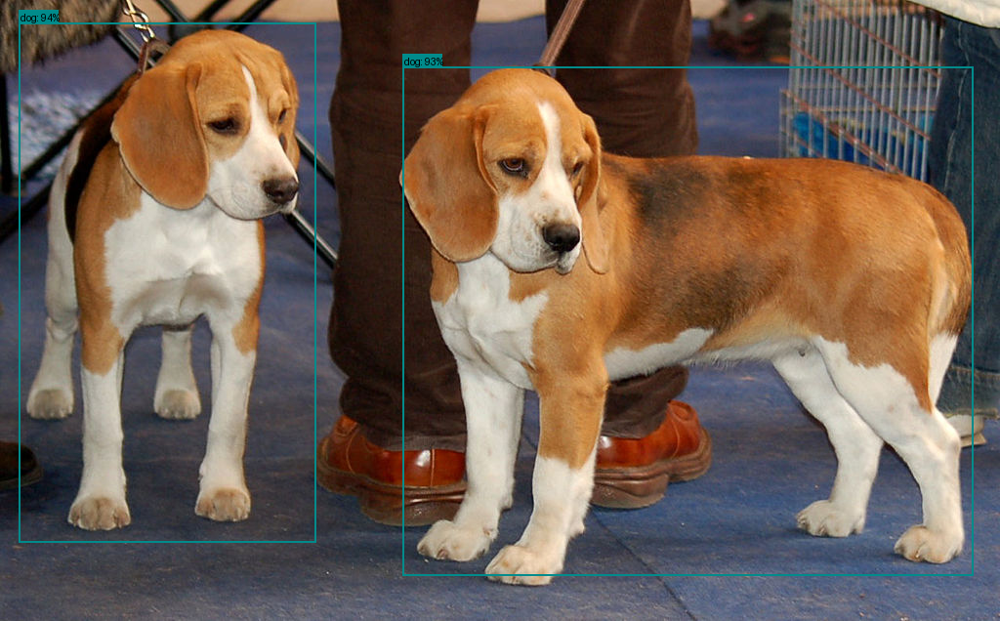

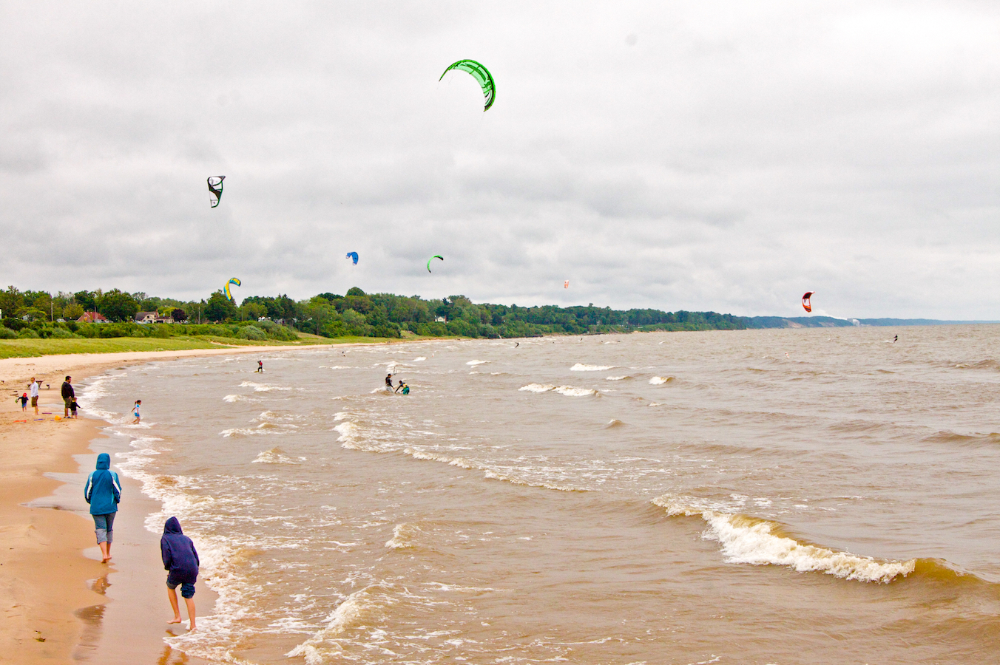

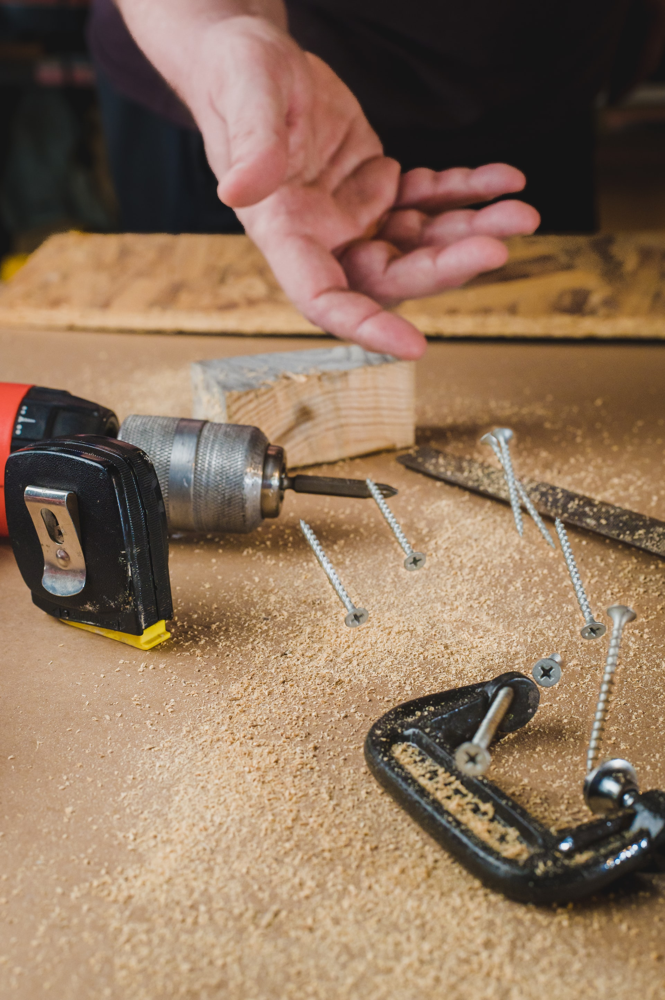

In [18]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path, 18)